<a href="https://colab.research.google.com/github/ynaloisp/datafest/blob/main/DATAFEST.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
import pandas as pd
import time

from google.colab import files
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from geopy.exc import GeocoderTimedOut, GeocoderUnavailable

geolocator = Nominatim(user_agent="geocoder")

uploaded = files.upload()

for fn in uploaded.keys():
  print('File "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])
  ))

leases_test = pd.read_csv('Leases_Manhattan.csv')

leases_test['full_address'] = leases_test.address + "," + leases_test.city + "," + leases_test.state + "," + leases_test.zip.astype(str)

# print(leases.head())

geocode = RateLimiter(geolocator.geocode, min_delay_seconds=2) # Create a RateLimiter instance with a 2-second delay

def geocode_with_retry(address):
    try:
        return geocode(address)
    except GeocoderTimedOut:
        print(f"Geocoding timed out for: {address}. Retrying...")
        time.sleep(5)  # Wait before retrying
        return geocode(address)
    except GeocoderUnavailable:
        print(f"Geocoding service unavailable for: {address}")
        return None
    except Exception as e:
        print(f"Geocoding error for: {address}. Error: {e}")
        return None


leases_test['gcode'] = leases_test.full_address.apply(geocode) # Apply the rate-limited geocode function

leases_test['lat'] = [g.latitude if g else None for g in leases_test.gcode]
leases_test['long'] = [g.longitude if g else None for g in leases_test.gcode]

print(leases_test)

Saving Leases_Manhattan.csv to Leases_Manhattan (1).csv
File "Leases_Manhattan (1).csv" with length 86492 bytes


Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/urllib3/connectionpool.py", line 534, in _make_request
    response = conn.getresponse()
               ^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/urllib3/connection.py", line 516, in getresponse
    httplib_response = super().getresponse()
                       ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/http/client.py", line 1395, in getresponse
    response.begin()
  File "/usr/lib/python3.11/http/client.py", line 325, in begin
    version, status, reason = self._read_status()
                              ^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/http/client.py", line 286, in _read_status
    line = str(self.fp.readline(_MAXLINE + 1), "iso-8859-1")
               ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/socket.py", line 718, in readinto
    return self._sock.recv_into(b)
           ^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/lib/python3.11/ssl.py", line

     year quarter  monthsigned     market        building_name  \
0    2018      Q1            1  Manhattan          1 E 33rd St   
1    2018      Q1            1  Manhattan           1 Park Ave   
2    2018      Q1            1  Manhattan     1 Trinity Centre   
3    2018      Q1            1  Manhattan   10 Rockefeller Plz   
4    2018      Q1            1  Manhattan  100104 Fifth Avenue   
..    ...     ...          ...        ...                  ...   
272  2018      Q1            1  Manhattan                  NaN   
273  2018      Q1            1  Manhattan                  NaN   
274  2018      Q1            1  Manhattan                  NaN   
275  2018      Q1            1  Manhattan                  NaN   
276  2018      Q1            1  Manhattan                  NaN   

                                           building_id               address  \
0    Manhattan_Park Avenue South_New York_1 E 33rd ...        1-13 E 33rd St   
1    Manhattan_Park Avenue South_New York_1 Par

In [4]:
import pandas as pd

mh_building_heights = pd.read_csv('footprints.csv')

print(mh_building_heights.head())

                                            the_geom NAME      BIN  \
0  MULTIPOLYGON (((-73.96664570466969 40.62599676...  NaN  3170958   
1  MULTIPOLYGON (((-74.16790202462265 40.63936048...  NaN  5028452   
2  MULTIPOLYGON (((-74.19510813278613 40.55610681...  NaN  5078368   
3  MULTIPOLYGON (((-73.96113466505085 40.57743931...  NaN  3245111   
4  MULTIPOLYGON (((-73.75421559146166 40.75591276...  NaN  4161096   

   CNSTRCT_YR  LSTMODDATE   LSTSTATYPE  DOITT_ID  HEIGHTROOF  FEAT_CODE  \
0      1925.0  08/22/2017  Constructed     96807   29.749853       2100   
1      1965.0  08/22/2017  Constructed    326368   22.630000       2100   
2      1970.0  08/22/2017  Constructed    746627   35.760000       2100   
3      1928.0  08/22/2017  Constructed    786626   37.500000       2100   
4      1950.0  08/22/2017  Constructed    746409   18.015113       2100   

   GROUNDELEV  SHAPE_AREA  SHAPE_LEN    BASE_BBL  MPLUTO_BBL  GEOMSOURCE  \
0        40.0           0          0  3065220021  30

#Ideas
Rent Price as a Function of Floor Height
- Visualized with a bar graph; buildings are bars

In [ ]:

leases = pd.read_csv('Leases.csv')
mh_leases = pd.read_csv('Leases_Manhattan.csv')
mmod = pd.read_csv('Major Market Occupancy Data-revised.csv')
pad = pd.read_csv('Price and Availability Data.csv')
unemployment = pd.read_csv('Unemployment.csv')

print(mh_leases.head())

   year quarter  monthsigned     market        building_name  \
0  2018      Q1            1  Manhattan          1 E 33rd St   
1  2018      Q1            1  Manhattan           1 Park Ave   
2  2018      Q1            1  Manhattan     1 Trinity Centre   
3  2018      Q1            1  Manhattan   10 Rockefeller Plz   
4  2018      Q1            1  Manhattan  100104 Fifth Avenue   

                                         building_id               address  \
0  Manhattan_Park Avenue South_New York_1 E 33rd ...        1-13 E 33rd St   
1  Manhattan_Park Avenue South_New York_1 Park Av...          One Park Ave   
2  Manhattan_WTC/Brookfield Place_New York_1 Trin...          111 Broadway   
3  Manhattan_Plaza South_New York_10 Rockefeller ...  10 Rockefeller Plaza   
4  Manhattan_Flatiron_New York_100104 Fifth Avenu...       100-104 5th Ave   

      region      city state  ...  overall_rent direct_available_space  \
0  Northeast  New York    NY  ...     73.739864                    NaN  

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df['available_space'], df['overall_rent'], alpha=0.7, color='blue')

# Add labels and title
plt.xlabel('Available Space')
plt.ylabel('Overall Rent')
plt.title('Scatterplot of Available Spaces vs Overall Rent')

# Show the plot
plt.grid(True)
plt.tight_layout()
plt.show()


NameError: name 'df' is not defined

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
from math import radians, cos, sin, asin, sqrt

# Load the main address dataset (with lat/long of addresses)
main_df = pd.read_csv("geocoded_manhattan_raw.csv")

# Load the subway station dataset
stations_df = pd.read_csv("MTA_Subway_Stations (1).csv")

# Filter subway stations for Manhattan only (borough = 'M')
manhattan_stations = stations_df[stations_df['Borough'] == 'M']
manhattan_stations = manhattan_stations[['GTFS Latitude', 'GTFS Longitude']].dropna()

# Haversine formula to compute great-circle distance in kilometers
def haversine(lat1, lon1, lat2, lon2):
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    r = 6371  # Radius of Earth in kilometers
    return c * r

# Function to find distance to the nearest Manhattan subway station
def nearest_station_distance(lat, lon):
    distances = manhattan_stations.apply(
        lambda row: haversine(lat, lon, row['GTFS Latitude'], row['GTFS Longitude']), axis=1)
    return distances.min()

# Add a new column for the nearest subway distance
main_df['distance_to_nearest_subway_km'] = main_df.apply(
    lambda row: nearest_station_distance(row['lat'], row['long'])
    if pd.notnull(row['lat']) and pd.notnull(row['long']) else None,
    axis=1
)

# Save the updated file
main_df.to_csv("geocoded_manhattan.csv", index=False)
print("Done! Saved to ny_with_subway_distance.csv")


FileNotFoundError: [Errno 2] No such file or directory: 'geocoded_manhattan_raw.csv'

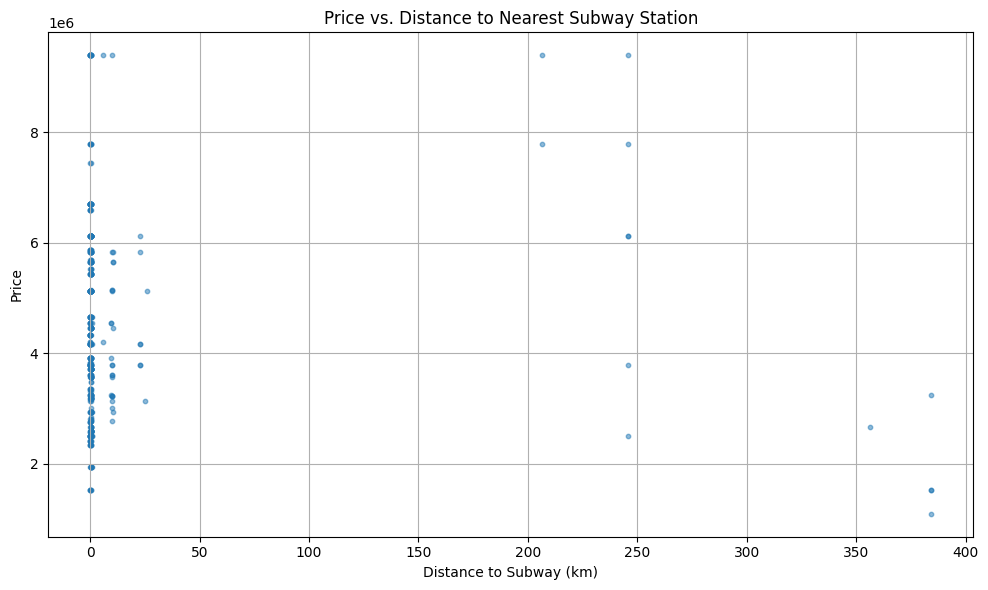

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("ny_with_subway_distance.csv")

# Drop rows where distance or price is missing
df = df.dropna(subset=['distance_to_nearest_subway_km', 'leasing'])

# Optional: filter out outliers if needed
# df = df[df['price'] < 10000]

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(df['distance_to_nearest_subway_km'], df['leasing'], alpha=0.5, s=10)
plt.title("Price vs. Distance to Nearest Subway Station")
plt.xlabel("Distance to Subway (km)")
plt.ylabel("Price")
plt.grid(True)
plt.tight_layout()
plt.show()


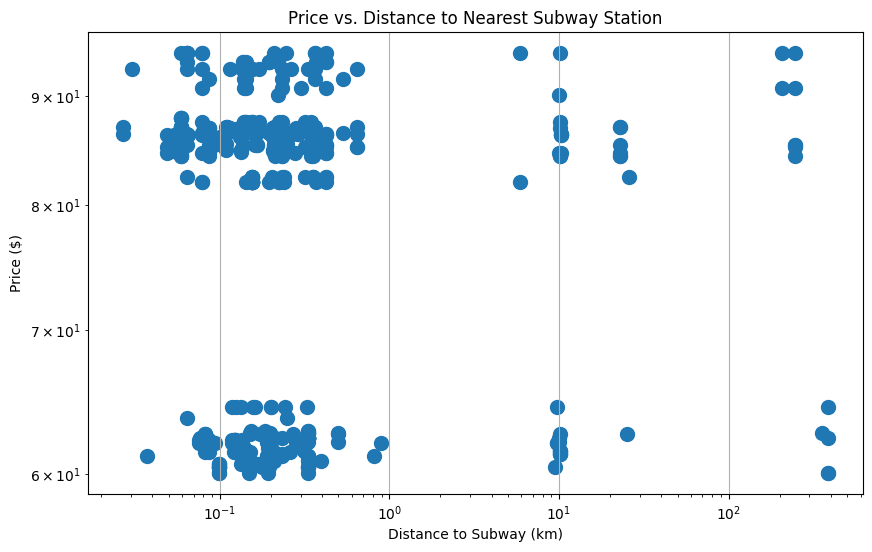

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("ny_with_subway_distance.csv")

# Clean the price column if needed (remove $ or commas)
"""if df['internal_class_rent'].dtype == object:
    df['internal_class_rent'] = df['internal_class_rent'].replace('[\$,]', '', regex=True).astype(float)
"""
# Drop rows missing either column
#df = df.dropna(subset=['distance_to_nearest_subway_km', 'internal_class_rent'])

# Optional: filter out extreme outliers
#df = df[(df['price'] > 100) & (df['internal_class_rent'] < 10000)]

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['distance_to_nearest_subway_km'], df['internal_class_rent'], s=100)
plt.title("Price vs. Distance to Nearest Subway Station")
plt.xlabel("Distance to Subway (km)")
plt.ylabel("Price ($)")
plt.grid(True)
#plt.tight_layout()
plt.loglog()

plt.show()


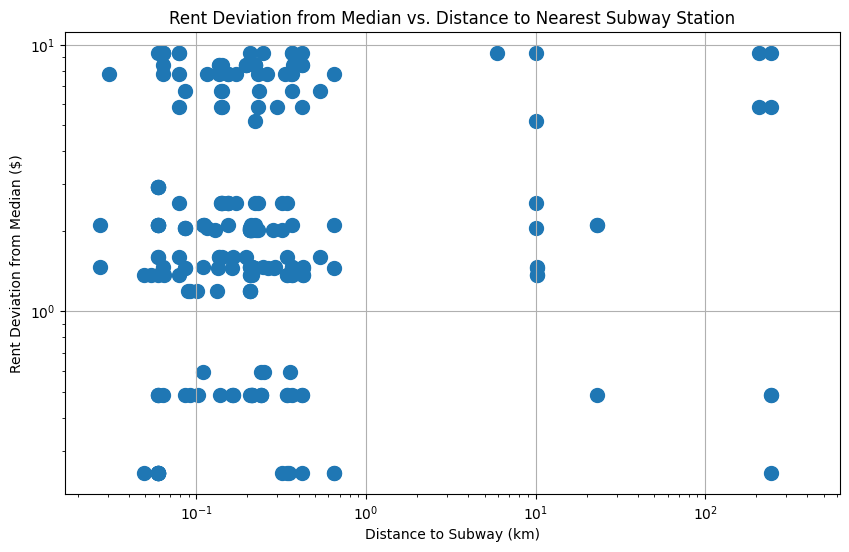

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("ny_with_subway_distance.csv")

# Drop rows with missing values
df = df.dropna(subset=['distance_to_nearest_subway_km', 'internal_class_rent'])

# Compute the median rent
median_rent = df['internal_class_rent'].median()

# Compute deviation from median
df['rent_deviation'] = df['internal_class_rent'] - median_rent

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(df['distance_to_nearest_subway_km'], df['rent_deviation'], s=100)
plt.title("Rent Deviation from Median vs. Distance to Nearest Subway Station")
plt.xlabel("Distance to Subway (km)")
plt.ylabel("Rent Deviation from Median ($)")
plt.grid(True)
plt.loglog()
plt.axhline(0, color='gray', linestyle='--')  # line at median

plt.show()


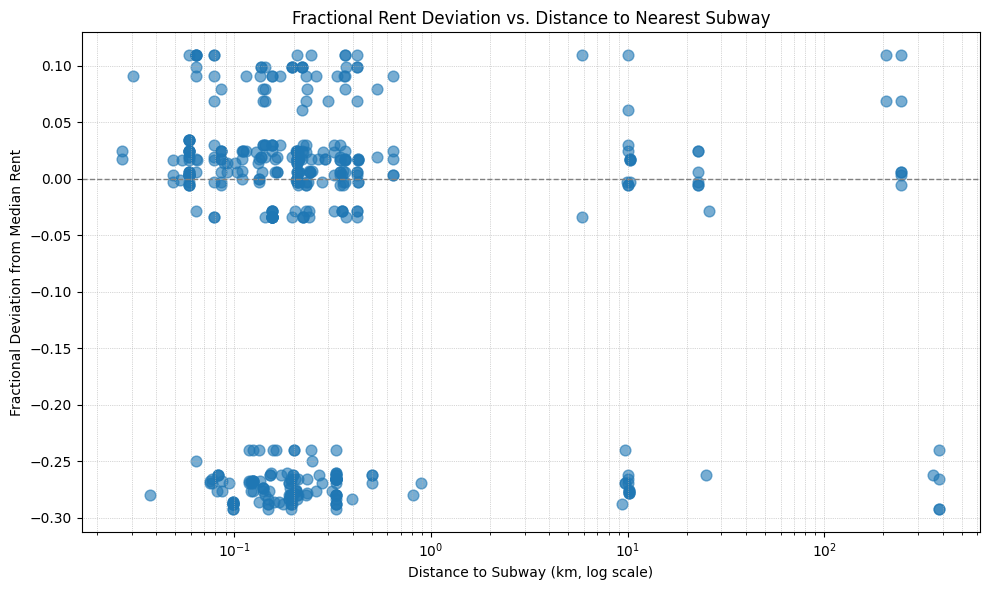

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("ny_with_subway_distance.csv")

# Drop rows with missing values
df = df.dropna(subset=['distance_to_nearest_subway_km', 'internal_class_rent'])

# Compute the median rent
median_rent = df['internal_class_rent'].median()

# Compute fractional deviation: (rent - median) / median
df['rent_frac_dev'] = (df['internal_class_rent'] - median_rent) / median_rent

# Optional: Filter out very extreme deviations if needed
# df = df[df['rent_frac_dev'].abs() < 1]  # remove >100% deviations

# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(df['distance_to_nearest_subway_km'], df['rent_frac_dev'], s=60, alpha=0.6)

plt.xscale('log')         # Distance can vary over orders of magnitude
plt.yscale('linear')      # We want to see negative and positive deviation clearly

plt.axhline(0, color='gray', linestyle='--', linewidth=1)
plt.grid(True, which='both', linestyle=':', linewidth=0.5)

plt.title("Fractional Rent Deviation vs. Distance to Nearest Subway")
plt.xlabel("Distance to Subway (km, log scale)")
plt.ylabel("Fractional Deviation from Median Rent")
plt.tight_layout()
plt.show()


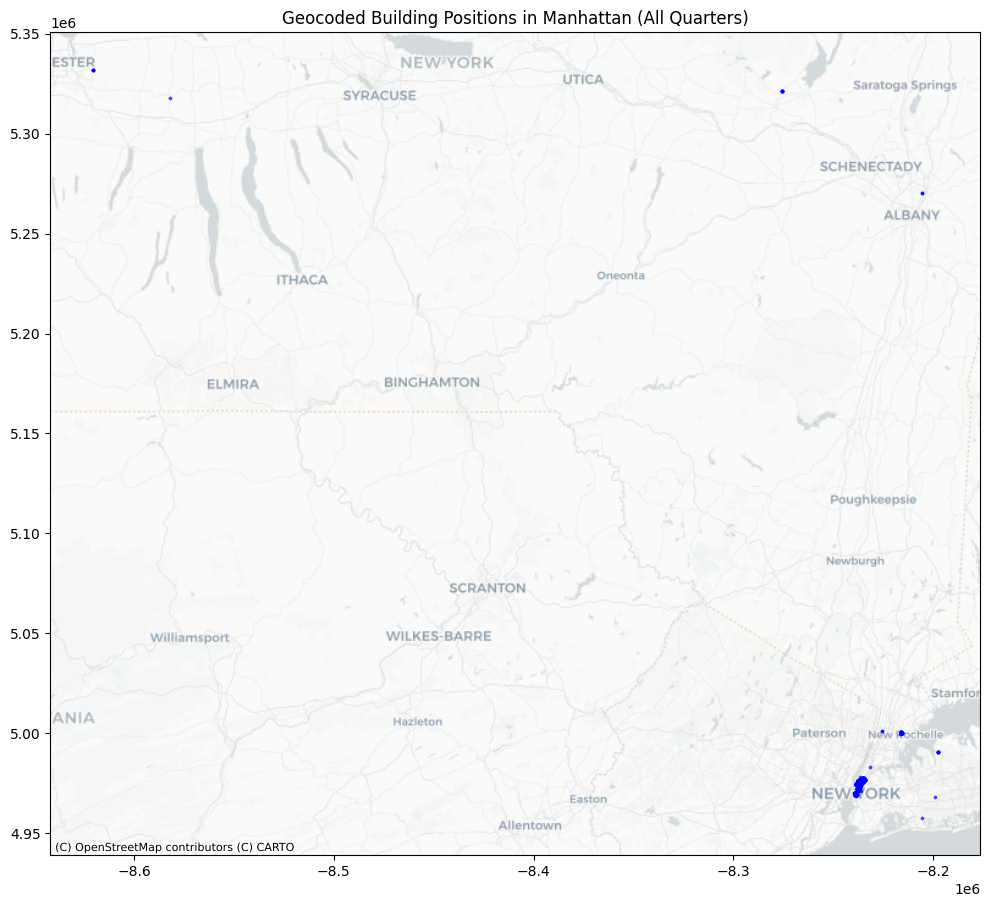

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Load the geocoded data
df = pd.read_csv("geocoded_leases_manhattan.csv")

# Drop missing coordinates
df = df.dropna(subset=['lat', 'long'])

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['long'], df['lat']),
    crs="EPSG:4326"  # WGS84 (lat/lon)
)

# Convert to Web Mercator for plotting with basemaps
gdf = gdf.to_crs(epsg=3857)

# Optional: filter a single quarter to avoid overplotting
# gdf = gdf[gdf['quarter'] == '2023 Q2']

# Plot
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, markersize=3, alpha=0.6, color='blue')

# Add NYC basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.set_title("Geocoded Building Positions in Manhattan (All Quarters)")
ax.axis('on')
plt.show()


In [ ]:
!pip install geopandas contextily matplotlib pandas


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 79.9 MB/s eta 0:00:00


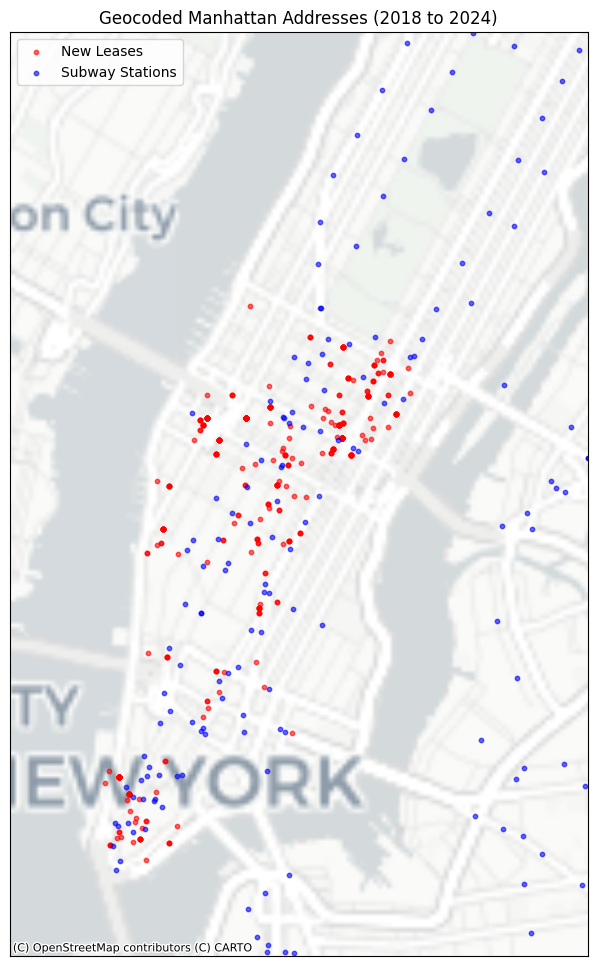

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Load the geocoded data
df = pd.read_csv("geocoded_leases_manhattan.csv")
df_subway = pd.read_csv("MTA_Subway_Stations.csv")

# Drop rows with missing lat/long
df = df.dropna(subset=['lat', 'long'])

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['long'], df['lat']),
    crs="EPSG:4326"  # WGS84: standard lat/lon
)

# Convert to GeoDataFrame
gdf_subway = gpd.GeoDataFrame(
    df_subway,
    geometry=gpd.points_from_xy(df_subway['GTFS Longitude'], df_subway['GTFS Latitude']),
    crs="EPSG:4326"  # WGS84: standard lat/lon
)

# Convert to Web Mercator for contextily basemap
gdf = gdf.to_crs(epsg=3857)
gdf_subway = gdf_subway.to_crs(epsg=3857)

# Plotting
fig, ax = plt.subplots(figsize=(12, 12))
gdf.plot(ax=ax, markersize=10, color='red', alpha=0.6,label = 'New Leases')
gdf_subway.plot(ax=ax, markersize=10, color='blue', alpha=0.6, label = 'Subway Stations')

# Add basemap (Manhattan)
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zoom=11  # tweak this value for more/less detail
)

ax.set_title("Geocoded Manhattan Addresses (2018 to 2024)")
#ax.set_axis_off()
plt.xticks([])
plt.yticks([])
plt.legend()
ax.set_xlim(-8241000,-8231000)
ax.set_ylim(4967000,4983000)
plt.show()


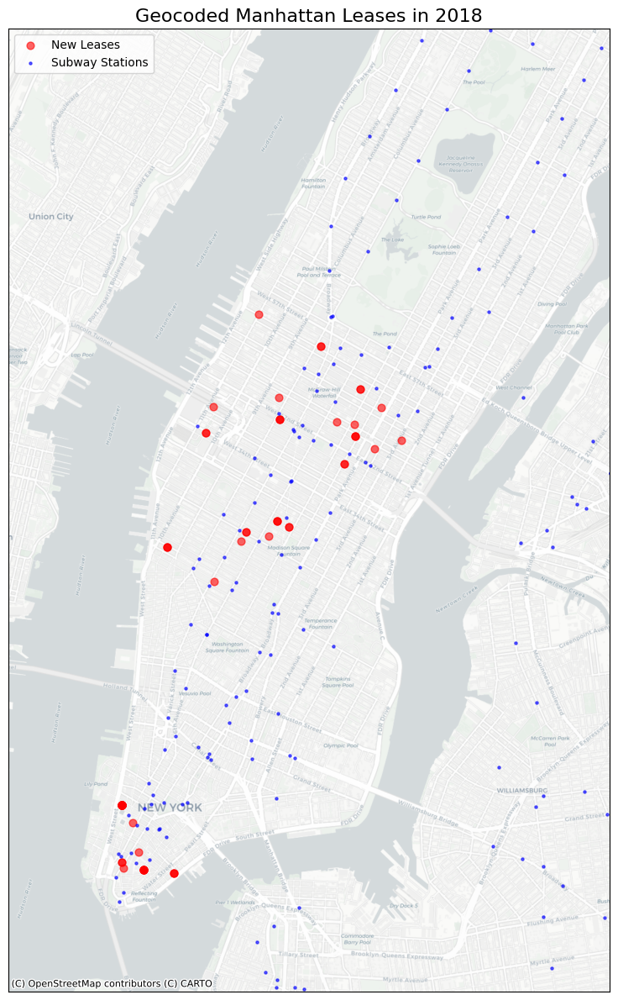

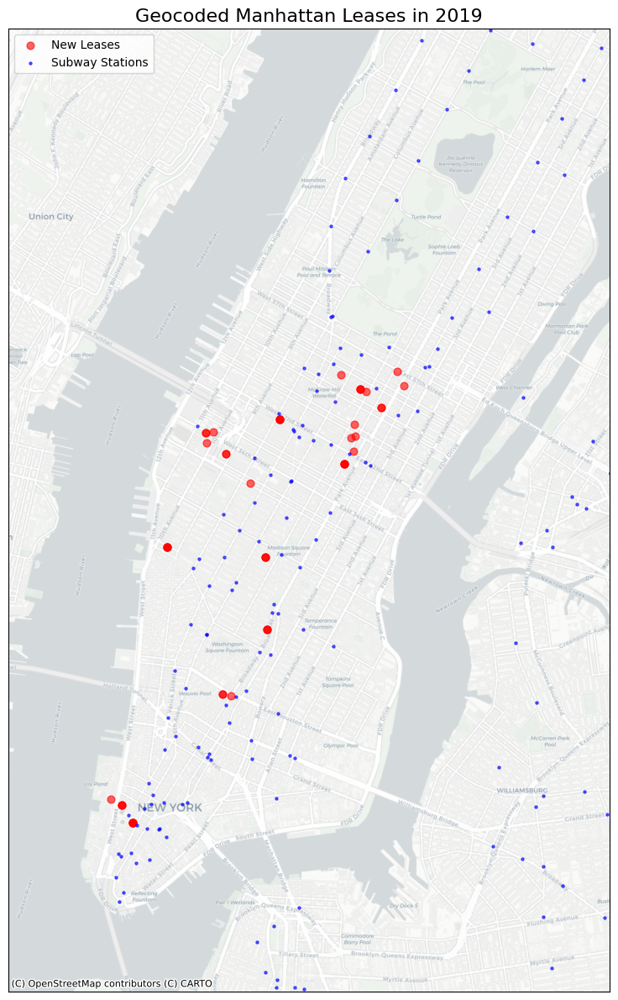

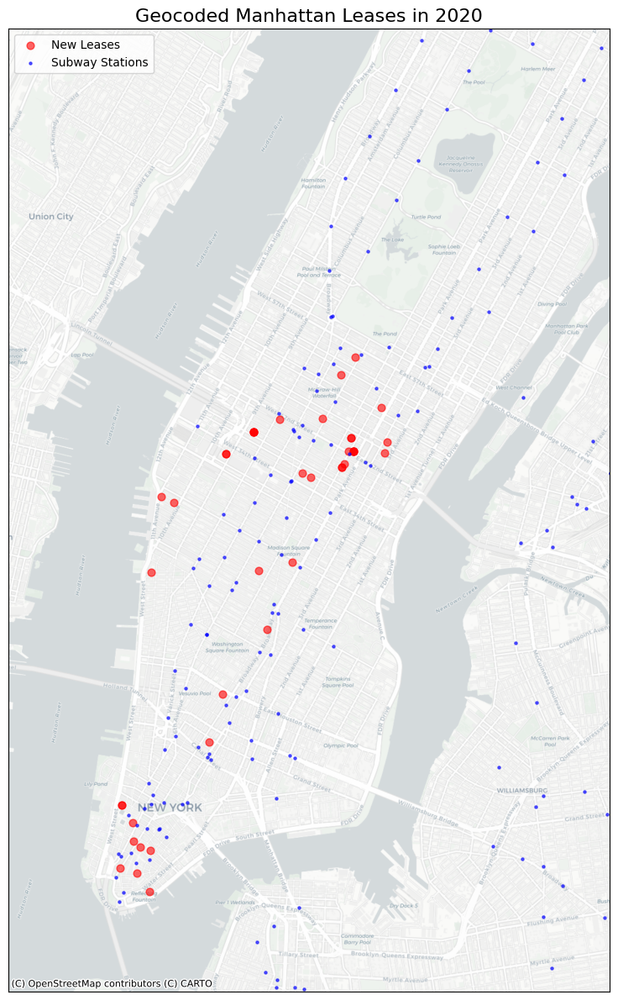

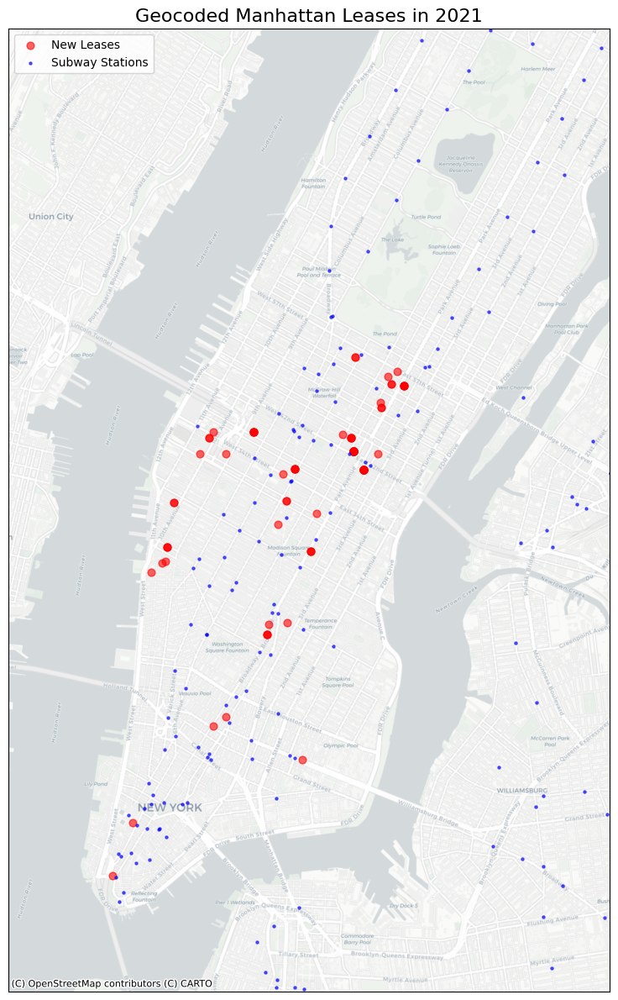

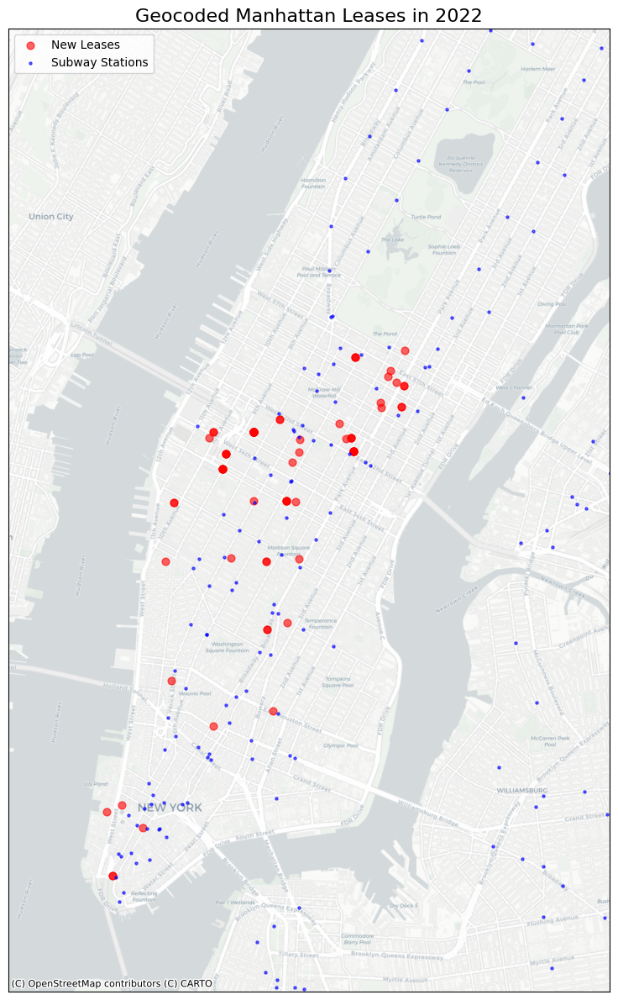

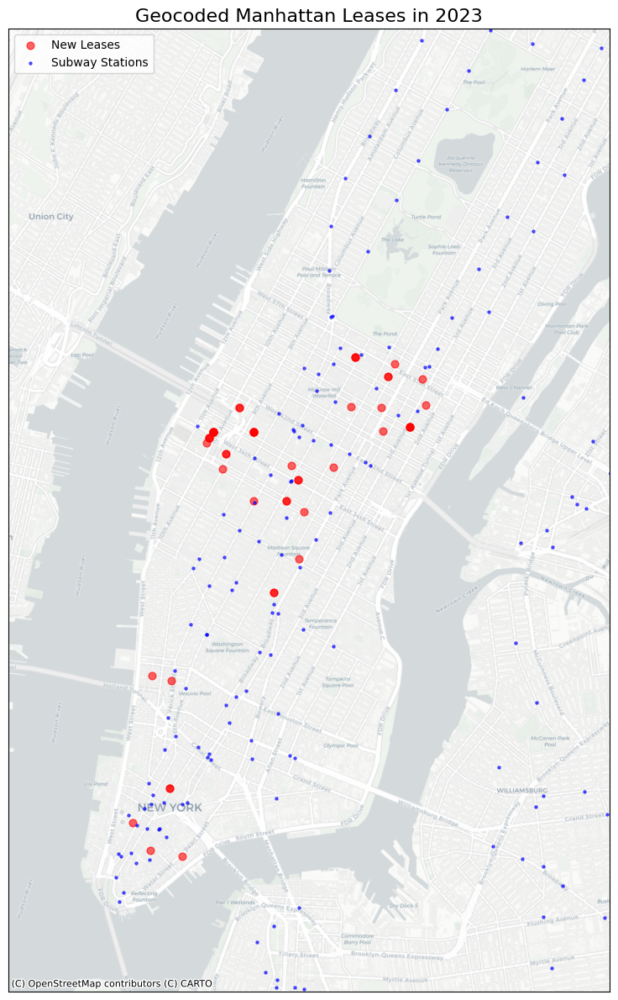

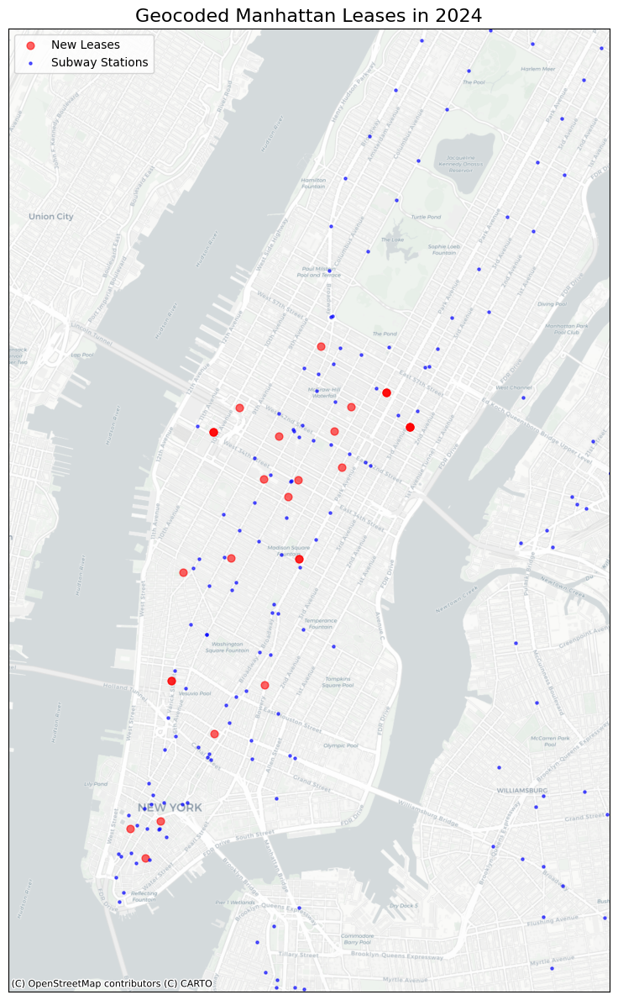

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Optional: Cache tiles to avoid repeated downloads
# ctx.set_cache_dir("./tile_cache")

# Load the geocoded data
df = pd.read_csv("geocoded_leases_manhattan.csv")
df_subway = pd.read_csv("MTA_Subway_Stations.csv")

# Drop rows with missing lat/long
df = df.dropna(subset=['lat', 'long'])

# Manhattan map bounds in EPSG:3857
xlim = (-8241000, -8231000)
ylim = (4967000, 4983000)

# Loop through each year and plot
for year in range(2018, 2025):
    df_year = df[df['year'] == year]

    # Convert to GeoDataFrames
    gdf = gpd.GeoDataFrame(
        df_year,
        geometry=gpd.points_from_xy(df_year['long'], df_year['lat']),
        crs="EPSG:4326"
    )
    gdf_subway = gpd.GeoDataFrame(
        df_subway,
        geometry=gpd.points_from_xy(df_subway['GTFS Longitude'], df_subway['GTFS Latitude']),
        crs="EPSG:4326"
    )

    # Project to Web Mercator
    gdf = gdf.to_crs(epsg=3857)
    gdf_subway = gdf_subway.to_crs(epsg=3857)

    # Plotting
    fig, ax = plt.subplots(figsize=(12, 12))
    gdf.plot(ax=ax, markersize=40, color='red', alpha=0.6, label='New Leases')
    gdf_subway.plot(ax=ax, markersize=5, color='blue', alpha=0.6, label='Subway Stations')

    # Set fixed Manhattan bounds
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    # Add basemap for only the visible extent
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        zoom=14,
        crs=gdf.crs
    )

    ax.set_title(f"Geocoded Manhattan Leases in {year}", fontsize=16)
    plt.xticks([])
    plt.yticks([])
    plt.legend()
    plt.tight_layout()
    plt.savefig(f"leases_{year}.png", dpi=600)

    plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Load the geocoded data
df = pd.read_csv("geocoded_leases_manhattan.csv")

# Drop rows with missing lat/long
df = df.dropna(subset=['lat', 'long'])

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['long'], df['lat']),
    crs="EPSG:4326"
)

# Convert to Web Mercator
gdf = gdf.to_crs(epsg=3857)

# Get Manhattan bounds with padding
minx, miny, maxx, maxy = gdf.total_bounds
pad_x = (maxx - minx) * 0.05
pad_y = (maxy - miny) * 0.05
xlim = (minx - pad_x, maxx + pad_x)
ylim = (miny - pad_y, maxy + pad_y)

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, markersize=2, color='red', alpha=0.6)

# Set bounds BEFORE adding the basemap
ax.set_xlim(xlim)
ax.set_ylim(ylim)

# Add basemap with auto-zoom based on those bounds
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    zoom=14  # tweak this value for more/less detail
)
ax.set_xlim(-8241000,-8231000)
ax.set_ylim(4967000,4983000)
ax.set_title("Geocoded Manhattan Addresses (2018 Q1 to 2024 Q4)")
plt.axis("off")
plt.show()


In [ ]:
footprintscsv = pd.read_csv('footprints.csv')

print(footprintscsv.head())

#footprints = gpd.read_file("Building Footprints_20250412.geojson")
print(footprints.head())

In [ ]:
# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df['long'], df['lat']), crs="EPSG:4326"
)

# Reproject to match DOITT footprint CRS (usually EPSG:2263 or EPSG:3857 depending on source)
gdf = gdf.to_crs(epsg=2263)

# Load NYC Building Footprints (shapefile or GeoJSON)
footprints = gpd.read_file("Building Footprints_20250412.geojson")[["geometry", "doitt_id"]]
footprints = footprints.to_crs(epsg=2263)

# Spatial join: which building each point lands in
joined = gpd.sjoin(gdf, footprints, how="left", predicate="within")

# Now 'joined' will have a new 'DOITT_ID' column matched to each address
print(joined[['address', 'doitt_id']])

In [ ]:
from google.colab import files

# Save the DataFrame to CSV
joined.to_csv('doitts.csv', index=False)

# Download the CSV file
files.download('doitts.csv')

In [ ]:
import pandas as pd

# Load your two tables
big_df = pd.read_csv("footprints.csv")     # Contains DOITT_ID and HEIGHTROOF
small_df = pd.read_csv("Manhattan_doitts.csv")              # Contains just DOITT_ID
small_df.rename(columns={'doitt_id': 'DOITT_ID'}, inplace=True)
# Merge HEIGHTROOF into the smaller table using DOITT_ID
merged_df = small_df.merge(
    big_df[['DOITT_ID', 'HEIGHTROOF']],  # only keep relevant columns from big_df
    on='DOITT_ID',
    how='left'  # keeps all rows from small_df
)

# Now merged_df has HEIGHTROOF for matching buildings
print(merged_df.head())


In [ ]:
# Save the DataFrame to CSV
merged_df.to_csv('MANHATTAN_FINAL.csv', index=False)

# Download the CSV file
files.download('MANHATTAN_FINAL.csv')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#available_space v building height


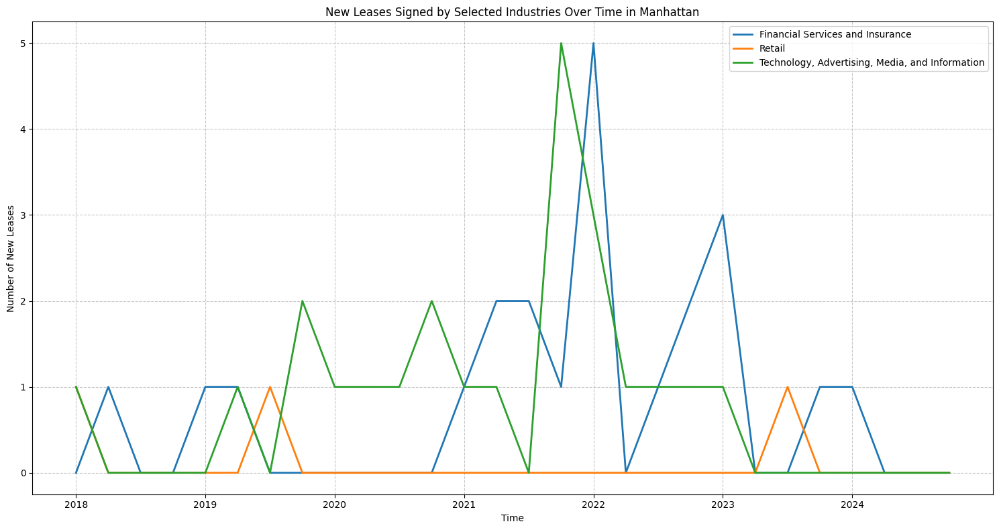

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

manhattan_leases = pd.read_csv('manhattan_final.csv')
new_leases = manhattan_leases[manhattan_leases['transaction_type'] == 'New']

# Filter only the industries you want
selected_industries = [
    'Financial Services and Insurance',
    'Retail',
    'Technology, Advertising, Media, and Information'
]

# Filter the dataframe to include only these industries
new_leases = new_leases[new_leases['internal_industry'].isin(selected_industries)]

# Create a year-quarter mapping that can be properly sorted
new_leases['year_quarter'] = new_leases['year'].astype(str) + new_leases['quarter']

# Create a numerical representation for sorting
new_leases['quarter_num'] = new_leases['quarter'].map({'Q1': 0, 'Q2': 0.25, 'Q3': 0.5, 'Q4': 0.75})
new_leases['year_quarter_num'] = new_leases['year'] + new_leases['quarter_num']

# Find the count of leases grouped by industry and year_quarter
lease_count = new_leases.groupby(['internal_industry', 'year_quarter', 'year_quarter_num']).size().reset_index(name='lease_count')

# Generate all possible year-quarter combinations
min_year = int(new_leases['year'].min())
max_year = int(new_leases['year'].max())

# Create a complete list of year-quarters from min to max
all_quarters = []
all_quarter_nums = []
quarters = ['Q1', 'Q2', 'Q3', 'Q4']

for year in range(min_year, max_year + 1):
    for q_idx, quarter in enumerate(quarters):
        all_quarters.append(f"{year}{quarter}")
        all_quarter_nums.append(year + q_idx * 0.25)

# Sort by the numerical value
all_year_quarters = sorted(all_quarters)

# Create the plot with a color palette suitable for three industries
plt.figure(figsize=(15, 8))
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Blue, orange, green

# Plot each industry with specific colors - no circle markers
for i, industry in enumerate(selected_industries):
    industry_data = lease_count[lease_count['internal_industry'] == industry]

    # Create a series for all quarters, with 0 for missing values
    industry_counts = []
    for yq in all_year_quarters:
        if yq in industry_data['year_quarter'].values:
            count = industry_data[industry_data['year_quarter'] == yq]['lease_count'].values[0]
            industry_counts.append(count)
        else:
            industry_counts.append(0)

    # Use just the line without markers
    plt.plot(np.arange(len(all_year_quarters)), industry_counts,
             '-', linewidth=2, label=industry, color=colors[i])

plt.xlabel('Time')
plt.ylabel('Number of New Leases')
plt.title('New Leases Signed by Selected Industries Over Time in Manhattan')

# Modify x-ticks to only show years
year_positions = []
year_labels = []

for i, yq in enumerate(all_year_quarters):
    year = yq[:4]
    # If this is Q1 of any year, mark the position
    if yq.endswith('Q1'):
        year_positions.append(i)
        year_labels.append(year)

plt.xticks(year_positions, year_labels, rotation=0)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [ ]:
# Re-import necessary libraries after kernel reset
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Simulate the structure of the expected dataset for demonstration
df = pd.read_csv('ny_with_subway_distance.csv')
df = df[['lat', 'long', 'HEIGHTROOF', 'distance_to_nearest_subway_km']].dropna()
# Select relevant features
features = df[['lat', 'long', 'HEIGHTROOF', 'distance_to_nearest_subway_km']]

# Standardize features for clustering
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df['cluster'] = kmeans.fit_predict(features_scaled)

# Plot clusters on a map
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='long', y='lat', hue='cluster', palette='Set2', s=100)
plt.title("Spatial Clustering of Buildings in Manhattan")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.legend(title="Cluster")
plt.show()
#GREEN IS SHORTEST BUILDINGS AND FURTHEST FROM S

In [ ]:
# --- Summarize what each cluster looks like ---
cluster_summary = df.groupby('cluster')[['HEIGHTROOF', 'distance_to_nearest_subway_km', 'lat', 'long']].agg(['mean', 'median', 'std'])
print("📊 Cluster Summary:\n", cluster_summary)

# --- See how many buildings are in each cluster ---
cluster_counts = df['cluster'].value_counts().sort_index()
print("\n🏢 Number of Buildings per Cluster:\n", cluster_counts)

# --- Optional: Visual comparison of building heights per cluster ---
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.boxplot(data=df, x='cluster', y='HEIGHTROOF', palette='Set2')
plt.title("Building Height Distribution by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Building Height (ft)")
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load and prep data
df = pd.read_csv("MANHATTAN_FINAL - MANHATTAN_FINAL.csv")
df = df.rename(columns={'AP': 'HEIGHTROOF', 'W': 'available_space'})
df = df.dropna(subset=['lat', 'long', 'HEIGHTROOF', 'available_space'])

# Normalize available_space to scale bar width/depth
space_scaled = (df['available_space'] - df['available_space'].min()) / (df['available_space'].max() - df['available_space'].min())
bar_size = 0.0005 + (space_scaled * 0.0015)  # bar width/depth in degrees

# Create figure
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')

# Plot each bar
for i, row in df.iterrows():
    ax.bar3d(
        x=row['long'] - bar_size[i]/2,  # center the bar
        y=row['lat'] - bar_size[i]/2,
        z=0,                            # all bars start at ground level
        dx=bar_size[i],
        dy=bar_size[i],
        dz=row['HEIGHTROOF'],
        color=plt.cm.viridis(row['HEIGHTROOF'] / df['HEIGHTROOF'].max()),
        alpha=0.9,
        edgecolor='black',
        linewidth=0.1
    )

# Axis labels
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Building Height (HEIGHTROOF)')
ax.set_title('3D Column Plot: Manhattan Buildings by Height and Available Space')

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load and clean data
df = pd.read_csv("MANHATTAN_FINAL - MANHATTAN_FINAL.csv")
df = df.rename(columns={'AP': 'HEIGHTROOF', 'W': 'available_space'})
df = df.dropna(subset=['lat', 'long', 'HEIGHTROOF', 'available_space'])

# Normalize available_space for marker size
size_scaled = (df['available_space'] - df['available_space'].min()) / (df['available_space'].max() - df['available_space'].min())
marker_sizes = 20 + (size_scaled * 180)  # Range: 20 to 200

# Create 3D plot
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    df['long'],              # X-axis: Longitude
    df['lat'],               # Y-axis: Latitude
    df['HEIGHTROOF'],        # Z-axis: Building Height
    c=df['HEIGHTROOF'],      # Color by Height
    s=marker_sizes,          # Size by available space
    cmap='viridis',
    alpha=0.8,
    edgecolor='k',
    linewidth=0.2
)

# Add colorbar
cb = fig.colorbar(sc, ax=ax, shrink=0.6, pad=0.1)
cb.set_label('Building Height (HEIGHTROOF)')

# Label axes
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_zlabel('Building Height (HEIGHTROOF)')
ax.set_title('3D Plot: Manhattan Building Height & Available Space')

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection


df = pd.read_csv("MANHATTAN_FINAL - MANHATTAN_FINAL.csv")

df = df.rename(columns={'AP': 'HEIGHTROOF', 'W': 'available_space'})


df = df.dropna(subset=['lat', 'long', 'HEIGHTROOF', 'available_space', 'quarter', 'year'])

# Convert year to integer if it's not already
df['year'] = df['year'].astype(int)

# Group data by year and then by quarter
year_groups = df.groupby('year')

for year, year_group in year_groups:
    quarter_groups = year_group.groupby('quarter')

    for quarter, group in quarter_groups:
        group = group.reset_index(drop=True)

        # Normalize available space for visual scaling
        space_scaled = (group['available_space'] - group['available_space'].min()) / (group['available_space'].max() - group['available_space'].min())
        bar_size = 0.0005 + (space_scaled * 0.0015)

        fig = plt.figure(figsize=(14, 10))
        ax = fig.add_subplot(111, projection='3d')

        # Plot each building as a cuboid
        for i, row in group.iterrows():
            x = row['long'] - bar_size[i]/2
            y = row['lat'] - bar_size[i]/2
            z = 0
            dx = dy = bar_size[i]
            dz = row['HEIGHTROOF']

            verts = np.array([
                [x, y, z],
                [x + dx, y, z],
                [x + dx, y + dy, z],
                [x, y + dy, z],
                [x, y, z + dz],
                [x + dx, y, z + dz],
                [x + dx, y + dy, z + dz],
                [x, y + dy, z + dz],
            ])

            faces = [
                [verts[0], verts[1], verts[5], verts[4]],  # front
                [verts[1], verts[2], verts[6], verts[5]],  # right
                [verts[2], verts[3], verts[7], verts[6]],  # back
                [verts[3], verts[0], verts[4], verts[7]],  # left
                [verts[4], verts[5], verts[6], verts[7]],  # top
                [verts[0], verts[1], verts[2], verts[3]],  # bottom
            ]

            color = plt.cm.viridis(dz / group['HEIGHTROOF'].max())
            poly3d = Poly3DCollection(faces, facecolors=color, edgecolors='black', linewidths=0.1, alpha=0.95)
            ax.add_collection3d(poly3d)

        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_zlabel('Building Height (HEIGHTROOF)')
        ax.set_title(f'3D Manhattan Buildings — {year} Q{quarter}')

        # Set consistent axis limits for better comparison across quarters
        ax.set_xlim(df['long'].min() - 0.01, df['long'].max() + 0.01)
        ax.set_ylim(df['lat'].min() - 0.01, df['lat'].max() + 0.01)
        ax.set_zlim(0, df['HEIGHTROOF'].max() * 1.1)

        plt.tight_layout()
        plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv("geocoded_manhattan.csv")

# Drop missing values
df = df.dropna(subset=['available_space', 'distance_to_nearest_subway_km'])

# Filter for reasonable values
#df = df[(df['available_space'] > 50) & (df['available_space'] < 1000000)]
df = df[df['distance_to_nearest_subway_km'] <= 10]  # limit to within 10 km of subway

# Plot: Available Space vs Distance to Subway
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=df,
    x='distance_to_nearest_subway_km',
    y='available_space',
    alpha=0.5,
    edgecolor=None
)

# Optional: trend line
sns.regplot(
    data=df,
    x='distance_to_nearest_subway_km',
    y='available_space',
    scatter=False,
    color='red',
    line_kws={'label': "Trend line"},
    truncate=False
)

# Labels and formatting
plt.title("Available Lease Area vs. Distance to Nearest Subway (≤10 km, Manhattan)")
plt.xlabel("Distance to Subway (km)")
plt.ylabel("Available Space (sqft)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.yscale("log")  # log scale helps with skewed lease size
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import linregress
import numpy as np

# Load data
df = pd.read_csv("geocoded_manhattan.csv")

# Drop missing and filter values
df = df.dropna(subset=['available_space', 'distance_to_nearest_subway_km'])
#df = df[(df['available_space'] > 50) & (df['available_space'] < 1000000)]
df = df[df['distance_to_nearest_subway_km'] <= 2]

# Run linear regression
x = df['distance_to_nearest_subway_km']
y = df['available_space']
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Generate regression line
x_vals = np.linspace(x.min(), x.max(), 100)
y_vals = slope * x_vals + intercept

# Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=x, y=y, alpha=0.5, edgecolor=None)
plt.plot(x_vals, y_vals, color='red', label=f"y = {slope:.2f}x + {intercept:.2f}\nR² = {r_value**2:.3f}")

# Labels and formatting
plt.title("Available Lease Area vs. Distance to Nearest Subway (≤10 km, Manhattan)")
plt.xlabel("Distance to Subway (km)")
plt.ylabel("Available Space (sqft)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.yscale("log")
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("geocoded_manhattan.csv")

# Drop missing and filter outliers
df = df.dropna(subset=['available_space', 'distance_to_nearest_subway_km', 'year'])
#df = df[(df['available_space'] > 50) & (df['available_space'] < 1000000)]
df = df[df['distance_to_nearest_subway_km'] <= 5]

# Plot with different colors and regression lines per year
sns.set_style("whitegrid")
g = sns.lmplot(
    data=df,
    x='distance_to_nearest_subway_km',
    y='available_space',
    hue='year',
    palette='tab10',
    scatter_kws={'alpha': 0.4, 's': 20},
    line_kws={'lw': 2},
    height=6,
    aspect=1.5,
    legend=True,
    truncate=False
)

# Axis formatting
plt.title("Lease Area vs. Subway Distance by Year (≤10 km, Manhattan)")
plt.xlabel("Distance to Nearest Subway (km)")
plt.ylabel("Available Space (sqft)")
plt.yscale("log")  # log to handle large area range
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
df = pd.read_csv("geocoded_manhattan.csv")

# Drop missing and filter outliers
df = df.dropna(subset=['available_space', 'distance_to_nearest_subway_km', 'year'])
#df = df[(df['available_space'] > 50) & (df['available_space'] < 1000000)]
df = df[df['distance_to_nearest_subway_km'] <= 1]

# Optional: make sure year is treated as categorical (for plotting order)
df['year'] = df['year'].astype(str)

# === 1. Boxplot: Lease Size by Year ===
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='year', y='available_space', palette='Set2')
plt.yscale('log')
plt.title("Distribution of Lease Sizes by Year (log scale)")
plt.xlabel("Year")
plt.ylabel("Available Space (sqft)")
plt.grid(True, axis='y', linestyle=':')
plt.tight_layout()
plt.show()

# === 2. Summary Statistics by Year ===
summary = df.groupby('year')['available_space'].describe()
print("📊 Lease Size Summary by Year:")
print(summary)

# === 3. Lease Count per Year ===
lease_counts = df['year'].value_counts().sort_index()
plt.figure(figsize=(8, 4))
sns.barplot(x=lease_counts.index, y=lease_counts.values, palette='pastel')
plt.title("Number of New Leases Signed per Year")
plt.xlabel("Year")
plt.ylabel("Lease Count")
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("geocoded_manhattan.csv")

# Filter: drop rows with missing ZIP, industry, or time
df = df.dropna(subset=['zip', 'internal_industry', 'year', 'available_space'])

# Optional: convert quarter to datetime if needed
# df['period'] = df['year'].astype(str) + " " + df['quarter']
# df['period'] = pd.to_datetime(df['period'])

# === 1. Total leased area per year per ZIP code ===
zip_year = df.groupby(['year', 'zip'])['available_space'].sum().reset_index()

# Pivot to make heatmapable
zip_pivot = zip_year.pivot(index='zip', columns='year', values='available_space').fillna(0)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(zip_pivot, cmap='YlGnBu', linewidths=0.5, linecolor='gray')
plt.title("Total Lease Area by ZIP Code and Year")
plt.xlabel("Year")
plt.ylabel("ZIP Code")
plt.tight_layout()
plt.show()

# === 2. Industry presence by ZIP + year (lease count or total area) ===
industry_zip = df.groupby(['year', 'zip', 'internal_industry'])['available_space'].sum().reset_index()

# Optional: filter to top N industries
top_industries = df['internal_industry'].value_counts().head(5).index
industry_zip = industry_zip[industry_zip['internal_industry'].isin(top_industries)]

# Plot one heatmap per industry
for ind in top_industries:
    ind_data = industry_zip[industry_zip['internal_industry'] == ind]
    pivot = ind_data.pivot(index='zip', columns='year', values='available_space').fillna(0)

    plt.figure(figsize=(12, 6))
    sns.heatmap(pivot, cmap='YlOrBr', linewidths=0.5, linecolor='gray')
    plt.title(f"Lease Area for Industry: {ind}")
    plt.xlabel("Year")
    plt.ylabel("ZIP Code")
    plt.tight_layout()
    plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
df = pd.read_csv("geocoded_manhattan.csv")

# Drop rows with missing necessary values
df = df.dropna(subset=['available_space', 'year', 'company_name'])

# Ensure year is string/categorical
df['year'] = df['year'].astype(str)

# Group by (year, tenant) to get one row per tenant per year
tenant_sizes = df.groupby(['year', 'company_name'])['available_space'].sum().reset_index()

# Compute summary statistics per year
size_summary = tenant_sizes.groupby('year')['available_space'].agg(['mean', 'median', 'count']).reset_index()

# Plot average and median lease size
plt.figure(figsize=(10, 6))
sns.lineplot(data=size_summary, x='year', y='mean', label='Mean Lease Size', marker='o')
sns.lineplot(data=size_summary, x='year', y='median', label='Median Lease Size', marker='o')
plt.title("Average and Median Lease Size per Tenant by Year")
plt.ylabel("Lease Size (sqft)")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

# Optional: also show number of unique tenants per year
plt.figure(figsize=(8, 4))
sns.barplot(data=size_summary, x='year', y='count', color='skyblue')
plt.title("Number of Unique Tenants per Year")
plt.xlabel("Year")
plt.ylabel("Tenant Count")
plt.tight_layout()
plt.show()
